### **Introduction**

Restructure a flattened and/or denormalized dataset so it can be loaded into a SQL or Graph database. Identify and demonstrate a form of analysis that is made easier by restructuring the data.

### **Dataset**

Yelp Dataset - https://www.kaggle.com/yelp-dataset/yelp-dataset

### **Importing Necessary Libraries**

In [ ]:
#Importing necessary libraries
import json
import pandas as pd
import matplotlib.pyplot as plt

### **Data Loading**

In [ ]:
# Load the Yelp dataset from JSON files into Python DataFrames
business_data = pd.read_json('business.json', lines=True)
business_data = pd.concat([pd.DataFrame(json.loads(line), index=[0]) for line in open('business.json')])

In [ ]:
# Display the first few rows to understand the structure
print(business_data.head())

              business_id                      name  \
0  Pns2l4eNsfO8kk83dixA6A  Abby Rappoport, LAC, CMQ   
0  mpf3x-BjTdTEA3yCZrAYPw             The UPS Store   
0  tUFrWirKiKi_TAnsVWINQQ                    Target   
0  MTSW4McQd7CbVtyjqoe9mw        St Honore Pastries   
0  mWMc6_wTdE0EUBKIGXDVfA  Perkiomen Valley Brewery   

                           address           city state postal_code  \
0           1616 Chapala St, Ste 2  Santa Barbara    CA       93101   
0  87 Grasso Plaza Shopping Center         Affton    MO       63123   
0             5255 E Broadway Blvd         Tucson    AZ       85711   
0                      935 Race St   Philadelphia    PA       19107   
0                    101 Walnut St     Green Lane    PA       18054   

    latitude   longitude  stars  review_count  is_open attributes  \
0  34.426679 -119.711197    5.0             7        0        NaN   
0  38.551126  -90.335695    3.0            15        1        NaN   
0  32.223236 -110.880452    3.5    

In [ ]:
# Save the dataframe as a CSV file
business_data.to_csv('business.csv', index=False)

In [ ]:
# Print the number of records loaded from each file
print(f"Number of business records: {len(business_data)}")

Number of business records: 150346


### **Reading the CSV File**

In [ ]:
# Read the CSV file back into a pandas dataframe
business_df = pd.read_csv('business.csv')

### **Data Cleaning**

In [ ]:
# Normalize Business Data (1NF)
business_data = business_df.copy().drop_duplicates()
business_data.reset_index(drop=True, inplace=True)

In [ ]:
# Save the normalized data as CSV files
business_data.to_csv('business.csv', index=False)

### **Database Implementation**

In [ ]:
import sqlite3

# Connect to SQLite database (create one if not exists)
conn = sqlite3.connect('yelp_business_data.db')
cursor = conn.cursor()

# Create tables with database schemas
cursor.execute('''
    CREATE TABLE IF NOT EXISTS Business (
        business_id VARCHAR(100) PRIMARY KEY,
        name VARCHAR(100),
        address VARCHAR(100),
        city VARCHAR(100),
        state VARCHAR(100),
        postal_code VARCHAR(100),
        latitude FLOAT,
        longitude FLOAT,
        stars FLOAT,
        review_count INT,
        is_open INT
    )
''')

# Commit changes and close connection
conn.commit()
conn.close()

print("Table created successfully.")


Table created successfully.


In [ ]:
# Connect to SQLite database
conn = sqlite3.connect('yelp_business_data.db')

# Read CSV file into a pandas dataframe
business_data = pd.read_csv('business.csv')

# Insert dataframe into SQLite table
business_data.to_sql('Business', conn, if_exists='replace', index=False)

# Commit changes and close connection
conn.commit()
conn.close()

print("Data inserted successfully.")

Data inserted successfully.


In [ ]:
import sqlite3
import pandas as pd

# Function to print table contents
def print_table(conn, Business):
    cursor = conn.cursor()
    cursor.execute(f"SELECT * FROM {Business}")
    rows = cursor.fetchall()
    if len(rows) == 0:
        print(f"No data in table '{Business}'.")
        return
    # Print column names
    col_names = [description[0] for description in cursor.description]
    print("Column Names:", col_names)
    # Print rows
    for row in rows:
        print(row)
    cursor.close()

# Connect to SQLite database
conn = sqlite3.connect('yelp_business_data.db')

# Print table before inserting data
print("Table 'Business' before inserting data:")
print_table(conn, 'Business')
print()

# Read CSV file into a pandas dataframe
business_data = pd.read_csv('business.csv')

# Insert dataframe into SQLite table
business_data.to_sql('Business', conn, if_exists='replace', index=False)

# Print table after inserting data
print("Table 'Business' after inserting data:")
print_table(conn, 'Business')
print()

# Commit changes and close connection
conn.commit()
conn.close()


Streaming output truncated to the last 5000 lines.
('oCbJpGl8IkH1WdYa25TDBA', "Morrow's", '2438 St Claude Ave', 'New Orleans', 'LA', '70117', 29.9687482, -90.0510926, 4.0, 831, 1, None, 'Burgers, Nightlife, Cajun/Creole, Bars, Restaurants, Seafood', None)
('MKHJy86fkFnMAhZac6wuLw', 'Chuck E. Cheese', '9175 Roosevelt, Ste 2', 'Philadelphia', 'PA', '19114', 40.076239, -75.03146, 2.5, 12, 1, None, 'Pizza, Venues & Event Spaces, Arcades, Arts & Entertainment, Event Planning & Services, Party & Event Planning, Restaurants, Active Life, Indoor Playcentre, Kids Activities', None)
('1et8GvbWnXrClLli988vJQ', 'Speedway', '920 North Green St', 'Brownsburg', 'IN', '46112', 39.855779, -86.393656, 2.5, 7, 1, None, 'Automotive, Coffee & Tea, Gas Stations, Food, Convenience Stores', None)
('vvRTTZl4ERtVnBEWv7KzzQ', "Gizmo's Galleria", '1012 E Main', 'Brownsburg', 'IN', '46112', 39.837746, -86.3796, 4.0, 20, 1, None, 'Thrift Stores, Shopping, Flea Markets', None)
('vFpbUcVAXxrSz5mFIzKbyw', "Miller's Al

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
('sYHh6-9n6PTxAWLFaWTz7g', 'Enchanted Nails', '2306 Carpenter Station Rd', 'Wilmington', 'DE', '19810', 39.8176987932, -75.466041281, 2.5, 15, 1, None, 'Nail Salons, Beauty & Spas', None)
('YQltt29gC_aiYAJIXSkbdA', 'Nashville Cigar', '4001 Hillsboro Pike', 'Nashville', 'TN', '37215', 36.1048788947, -86.8153830963, 5.0, 6, 1, None, 'Tobacco Shops, Shopping', None)
('90OqHj6ES9Npo2-ncdxurw', 'Green Garden', '1556 E Wadsworth Ave', 'Philadelphia', 'PA', '19150', 40.0801196, -75.1727528, 3.0, 11, 1, None, 'Chinese, Restaurants', None)
('xsyyMWSKHwnWrDygrdJ8aA', 'Patriot Parking', '2102 Sansom St', 'Philadelphia', 'PA', '19103', 39.951297, -75.1758498, 1.5, 11, 1, None, 'Automotive, Parking', None)
('zuolhAJZMexj75-5IZ8bQg', 'Sundance Cafe', '10000 N Oracle Rd', 'Tucson', 'AZ', '85737', 32.3879972, -110.9635916, 3.0, 19, 1, None, 'Breakfast & Brunch, Salad, Restaurants, American (New), Sandwiches', None)
('IhkMaYrHMVfV9CRjHc5ZBQ', "John's N

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
('wH94vFPKNVtBmQX5c7AfRA', 'East Front Cafe', '13 E Front St', 'Trenton', 'NJ', '08691', 40.219048, -74.765412, 4.5, 46, 0, None, 'Food, Cafes, Delis, Coffee & Tea, Restaurants', None)
('58ztb_BlAnuL5s2PZFclEw', 'HG Dance Club', '2617 Washington Ave', 'Saint Louis', 'MO', '63103', 38.6354098, -90.213968, 3.5, 6, 0, None, 'Nightlife, Dance Clubs, Bars', None)
('7glaDklehs5KxuoCmR9V1Q', 'Plaza Garibaldi', '935 Washington Ave', 'Philadelphia', 'PA', '19147', 39.9368243, -75.1593731, 3.5, 78, 1, None, 'Restaurants, Mexican', None)
('sLzSr1jesfVl3XOhLTq16A', 'Bommarito Honda', '330 Brookes Dr', 'Hazelwood', 'MO', '63042', 38.7779219, -90.364501, 3.5, 65, 1, None, 'Tires, Auto Repair, Automotive, Car Dealers, Auto Parts & Supplies', None)
('X_8E4KU08lWPRVG42hluFQ', 'Valvoline Instant Oil Change', '1735 St Charles Ave', 'New Orleans', 'LA', '70130', 29.93672, -90.0773508174, 5.0, 56, 1, None, 'Oil Change Stations, Automotive', None)
('RlKxbcx

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
('b6j7-_DA4rAnqLlX1ss_DA', 'Yardley Dermatology Associates', '903 Floral Vale Blvd', 'Yardley', 'PA', '19067', 40.220356, -74.8819358, 3.5, 18, 1, None, 'Doctors, Health & Medical, Dermatologists', None)
('Avma4aZMLi23OLyLqNSGAA', 'Arnold Dentistry', '257 W Brandon Blvd', 'Brandon', 'FL', '33511', 27.93727569, -82.2882422, 4.5, 12, 1, None, 'Dentists, Periodontists, Cosmetic Dentists, Health & Medical, General Dentistry', None)
('WlQWtxehIlmunNCszRtpdw', "Women's Wellness Center", '645 Sierra Rose Dr, Ste 204', 'Reno', 'NV', '89511', 39.474583, -119.7975353, 3.0, 19, 1, None, 'Obstetricians & Gynecologists, Doctors, Health & Medical', None)
('mP763Wd-QDXbGcIAgJVwtQ', 'Carmel Shell', '808 W Main St', 'Carmel', 'IN', '46032', 39.9784080658, -86.1416076, 2.5, 8, 1, None, 'Gas Stations, Automotive', None)
('CPWAs-AtTwNJexXly_FndQ', 'Tandoori Flame', '4302 S East St', 'Indianapolis', 'IN', '46227', 39.7022366, -86.1504086, 4.5, 112, 1, None

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
('43_6sYSU--eSMKxkYGF2Dg', 'Tire Kingdom', '7602 W Hillsborough Ave', 'Tampa', 'FL', '33615', 27.9962037278, -82.5653846562, 2.5, 20, 1, None, 'Oil Change Stations, Automotive, Tires, Auto Repair', None)
('LBmY41lixAYUuF0EjdTF8Q', 'Little Pearl Oyster Bar', '160 N 8th St', 'Boise', 'ID', '83702', 43.6158386, -116.2026816, 4.5, 36, 1, None, 'Specialty Food, Nightlife, Bars, Food', None)
('ZjKvLf-FxPLk7wJCwEIEcg', 'Brandon Parkway Trail', 'Brandon Pkwy', 'Brandon', 'FL', '33511', 27.9283046, -82.3112752, 3.5, 15, 1, None, 'Active Life, Parks', None)
('8KTlSzFYvBa-aRrDtSHAFQ', 'Idaho Real Estate School', '1450 S Eagle Flight Way, Ste 250', 'Boise', 'ID', '83709', 43.5916493, -116.2980448, 4.0, 5, 1, None, 'Real Estate Agents, Specialty Schools, Career Counseling, Education, Real Estate, Adult Education, Home Services, Professional Services, Vocational & Technical School', None)
('RpY32D_zRYFQPYHlrkDi9Q', "McDonald's", '5445 E Speedway Blv

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
('9ouyziwYpSvJzlLFpukSgA', 'Chipotle Mexican Grill', '3700 Park Blvd N', 'Pinellas Park', 'FL', '33781', 27.8388019441, -82.6846666245, 3.0, 88, 1, None, 'Mexican, Fast Food, Restaurants', None)
('lJ8DNVqsU6SgQ1_3107uiA', 'Madame Beaute', '5335 E Southport Rd, Unit 900', 'Indianapolis', 'IN', '46237', 39.6654875, -86.076603, 4.0, 5, 1, None, 'Nail Salons, Beauty & Spas, Eyelash Service, Waxing, Hair Removal', None)
('PXQGiGwBqfFuO81BFB3LHg', 'Beautiful Shades', '4718 Century Plaza Rd', 'Indianapolis', 'IN', '46254', 39.8357998, -86.243381, 4.0, 13, 0, None, 'Soul Food, African, Restaurants, American (Traditional)', None)
('gotfraY5VNmChiaUurKwgw', 'Jefferson Door', '1227 1st Ave', 'Harvey', 'LA', '70058', 29.8893609, -90.0789828, 2.5, 10, 1, None, 'Building Supplies, Door Sales/Installation, Garage Door Services, Home Services', None)
('5dKcKSb6kQPXkVTUTKUjGw', '390th Memorial Museum', '6000 E Valencia Rd', 'Tucson', 'AZ', '85706', 32.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




('xhcgw9ye0eFSL_eAji0xbw', 'Elan Salon', '9803 Clayton Rd', 'Saint Louis', 'MO', '63124', 38.638463, -90.390375, 4.0, 11, 1, None, 'Hair Salons, Beauty & Spas', None)
('Sv1MEZP-mMfp8SmE0hwYEA', 'Terakawa Ramen', '204 N 9th St', 'Philadelphia', 'PA', '19107', 39.955402, -75.154484, 4.5, 1693, 1, None, 'Japanese, Ramen, Ethnic Food, Restaurants, Local Flavor, Food, Specialty Food', None)
('EMp87GsYkVdwHftE7Ar2_w', 'Cosmic Café and Ciderhouse', '1 Boathouse Row', 'Philadelphia', 'PA', '19130', 39.9695828, -75.1876317, 4.0, 52, 1, None, 'Bars, Nightlife, Cafes, Restaurants, Breakfast & Brunch, Beer Bar', None)
('DabsPCkiR1sb3cWQb84sYg', 'SquareTrade Go', None, 'Indianapolis', 'IN', '46237', 39.6788037, -86.0835415, 4.0, 7, 1, None, 'Local Services, Electronics Repair, Mobile Phone Repair, IT Services & Computer Repair', None)
('Wme70zEmBZ9IN-Y052sV-w', 'Fellah Auto Group', '1501 Cottman Ave', 'Philadelphia', 'PA', '19111', 40.0564935, -75.0744838, 3.0, 20, 0, None, 'Used Car Dealers, Car 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
('CvXuklDLTDi14PbNAPvW1g', 'Mr. Wok', '650 S Vista Ave', 'Boise', 'ID', '83705', 43.59811018, -116.21325, 4.0, 187, 0, None, 'Sushi Bars, Japanese, Korean, Asian Fusion, Chinese, Restaurants', None)
('L7aB6oqQbkFn9T-0JEi9NQ', 'Fish’s Contracting & Concrete', None, 'Feasterville-Trevose', 'PA', '19053', 40.1466378, -74.9952259, 2.5, 5, 1, None, 'Masonry/Concrete, Painters, Home Services, Contractors', None)
('nEuUK3kc4Yl1jSbVlu_wag', 'A-Mrazek Moving Systems', '545 Leffingwell Ave', 'Kirkwood', 'MO', '63122', 38.572137, -90.3988531, 4.0, 14, 1, None, 'Movers, Local Services, Self Storage, Home Services', None)
('H1zluBWeIFkOamadC-j5MQ', 'anjuthreads', '1126 Walnut St, Fl 2', 'Philadelphia', 'PA', '19107', 39.9486813, -75.1603307, 4.0, 231, 0, None, 'Hair Removal, Beauty & Spas', None)
('TplX4186Az41l7q3cZhFRA', 'Bob Evans', '3335 Ulmerton Rd', 'Clearwater', 'FL', '33769', 27.894406, -82.678847, 3.0, 13, 0, None, 'Sandwiches, American (T

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
('bj_XFMwtl8SAy2hkd4ovDA', 'Shoe Service & Alterations', '10071 W Hillsborough Ave', 'Tampa', 'FL', '33615', 28.0053956, -82.5979024, 3.5, 8, 1, None, 'Local Services, Shoe Repair, Sewing & Alterations', None)
('E7ID7df0nNRqdJfavAZOBg', 'WTVT FOX 13', '3213 W Kennedy Blvd', 'Tampa', 'FL', '33609', 27.945372, -82.496272, 2.0, 20, 1, None, 'Television Stations, Mass Media', None)
('6kyHuvvCw_EsdiAm3Ui1ww', 'Munchies', '11208 E Dr Martin Luther King Jr', 'Seffner', 'FL', '33584', 27.9820616, -82.3098975, 3.0, 40, 1, None, 'Pizza, Restaurants, Chicken Wings', None)
('a5eW3-wAGpsBKeYe2VtF9A', 'Iron Tattoo', '206 Dekalb St, Ste 206', 'Norristown', 'PA', '19401', 40.1131339, -75.342501, 3.5, 6, 1, None, 'Tattoo, Tattoo Removal, Beauty & Spas, Health & Medical, Doctors, Piercing', None)
('o2g-zIr8LmOTCREEloHX2w', 'The Look', '1660 E Main St, Ste 109', 'Plainfield', 'IN', '46168', 39.710538, -86.3789717, 5.0, 13, 1, None, 'Beauty & Spas, Nail S

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
('Mcw56HK9GOPTKEL_9ExVEQ', 'Northern Liberties Veterinary Center', '622 N 2nd St', 'Philadelphia', 'PA', '19123', 39.961651, -75.1414493, 4.5, 62, 1, None, 'Pet Services, Veterinarians, Pet Sitting, Pets, Pet Groomers', None)
('yZu1zF8kQC0_P9ZA4wWmxA', 'Gulf Coast Seafood', '4921 9th Ave S', 'Gulfport', 'FL', '33707', 27.7616092, -82.7007571, 4.5, 25, 1, None, 'Food, Specialty Food, Seafood, Restaurants, Seafood Markets', None)
('B1L6-hN63I1S_cAijI5Otg', "Bill Gianino's Restaurant", '4571 Chestnut Park Plz', 'Saint Louis', 'MO', '63129', 38.4785391229, -90.305397549, 3.5, 83, 1, None, 'Restaurants, Italian', None)
('kHmvpYme4OoV8SKn0TlqAg', 'Twistee Treat - Gandy', '4418 W Gandy Blvd', 'Tampa', 'FL', '33611', 27.8930624603, -82.5194831418, 3.5, 40, 0, None, 'Ice Cream & Frozen Yogurt, Desserts, Restaurants, Hot Dogs, Food, Juice Bars & Smoothies', None)
('tozwA5at4htLiHEo2046vA', 'Home Furniture of Tucson', '6026 N Oracle Rd', 'Tucson'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
('4a4w3SUoLBm11LT9Z751BA', "Victoria's Nail", '533 Old Marlton Pike W', 'Marlton', 'NJ', '08053', 39.8939679, -74.9355036, 2.0, 29, 1, None, 'Nail Salons, Waxing, Beauty & Spas, Skin Care, Hair Removal', None)
('f44uARFaTuIPmbMn2VlSXg', "McDonald's", '140 Lapalco Blvd', 'Gretna', 'LA', '70056', 29.8819030867, -90.023102694, 2.0, 21, 1, None, 'Sandwiches, Burgers, Coffee & Tea, Restaurants, Food, Fast Food', None)
('6jgvOJ6HbbhspNmp8crrVA', 'Midas', '3616 S 6th Ave', 'Tucson', 'AZ', '85713', 32.1808743, -110.9686503278, 3.0, 24, 1, None, 'Oil Change Stations, Tires, Auto Repair, Automotive', None)
('-fJHTVafUBfsTOH_bopDBA', 'Spotted Donkey Cantina', '400B Mandalay Ave', 'Clearwater', 'FL', '33767', 27.9788772, -82.8279609, 3.5, 351, 1, None, 'Nightlife, Restaurants, Mexican, Cocktail Bars, New Mexican Cuisine, Bars', None)
('kuPgnP7jE6FmPx8C4fIs7w', 'The Cheshire', '6300 Clayton Rd', 'St. Louis', 'MO', '63117', 38.6332425, -90.306883622

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### **Analysis**

 I performed various analysis tasks, such as:

 1. Descriptive Statistics
 2. Data Aggregation
 3. Data Filtering
 4. Data Visualization
 5. Insights and Interpretation

### **Descriptive Statistics**

In [ ]:
# Connect to SQLite database
conn = sqlite3.connect('yelp_business_data.db')

# Function to execute SQL query and return pandas dataframe
def execute_query(query):
    return pd.read_sql_query(query, conn)

# Example 1: Descriptive statistics for numerical columns
query1 = '''
SELECT AVG(stars) AS avg_stars,
       MIN(stars) AS min_stars,
       MAX(stars) AS max_stars,
       COUNT(*) AS total_businesses
FROM Business;
'''
stats_df = execute_query(query1)
print("Descriptive Statistics for Numerical Columns:")
print(stats_df)

# Example 2: Top 10 categories by number of businesses
query2 = '''
SELECT categories, COUNT(*) AS business_count
FROM Business
GROUP BY categories
ORDER BY business_count DESC
LIMIT 10;
'''
top_categories_df = execute_query(query2)
print("\nTop 10 Categories by Number of Businesses:")
print(top_categories_df)

# Example 3: Average review count by city
query3 = '''
SELECT city, AVG(review_count) AS avg_review_count
FROM Business
GROUP BY city;
'''
avg_review_count_df = execute_query(query3)
print("\nAverage Review Count by City:")
print(avg_review_count_df)

# Example 4: Businesses with highest review counts
query4 = '''
SELECT name, city, state, review_count, stars
FROM Business
ORDER BY review_count DESC
LIMIT 10;
'''
top_reviewed_businesses_df = execute_query(query4)
print("\nBusinesses with Highest Review Counts:")
print(top_reviewed_businesses_df)

# Close connection
conn.close()


Descriptive Statistics for Numerical Columns:
   avg_stars  min_stars  max_stars  total_businesses
0   3.596724        1.0        5.0            150346

Top 10 Categories by Number of Businesses:
                   categories  business_count
0  Beauty & Spas, Nail Salons            1012
1          Restaurants, Pizza             935
2  Nail Salons, Beauty & Spas             934
3          Pizza, Restaurants             823
4        Restaurants, Mexican             728
5        Restaurants, Chinese             708
6        Mexican, Restaurants             672
7        Chinese, Restaurants             651
8          Food, Coffee & Tea             508
9  Beauty & Spas, Hair Salons             493

Average Review Count by City:
             city  avg_review_count
0     AB Edmonton          6.000000
1          AMBLER          9.000000
2         ARDMORE          8.000000
3            AVON         24.000000
4        Abington         28.573964
...           ...               ...
1411   wilmingt

### **Data Aggregation**

In [ ]:
# Connect to SQLite database
conn = sqlite3.connect('yelp_business_data.db')

# Function to execute SQL query and return pandas dataframe
def execute_query(query):
    return pd.read_sql_query(query, conn)

# Example 1: Average star rating by state
query1 = '''
SELECT state, AVG(stars) AS avg_star_rating
FROM Business
GROUP BY state;
'''
avg_star_rating_by_state_df = execute_query(query1)
print("Average Star Rating by State:")
print(avg_star_rating_by_state_df)

# Example 2: Median star rating by state
query2 = '''
SELECT state,
       (CASE
            WHEN COUNT(*) % 2 = 0 THEN AVG(stars)
            ELSE CAST(GROUP_CONCAT(stars, ',') AS REAL)
        END) AS median_star_rating
FROM Business
GROUP BY state;
'''
median_star_rating_by_state_df = execute_query(query2)
print("\nMedian Star Rating by State:")
print(median_star_rating_by_state_df)

# Example 3: Maximum star rating by state
query3 = '''
SELECT state, MAX(stars) AS max_star_rating
FROM Business
GROUP BY state;
'''
max_star_rating_by_state_df = execute_query(query3)
print("\nMaximum Star Rating by State:")
print(max_star_rating_by_state_df)

# Example 4: Minimum star rating by state
query4 = '''
SELECT state, MIN(stars) AS min_star_rating
FROM Business
GROUP BY state;
'''
min_star_rating_by_state_df = execute_query(query4)
print("\nMinimum Star Rating by State:")
print(min_star_rating_by_state_df)

# Close connection
conn.close()


Average Star Rating by State:
   state  avg_star_rating
0     AB         3.447515
1     AZ         3.592010
2     CA         3.996733
3     CO         4.000000
4     DE         3.354967
5     FL         3.610957
6     HI         4.250000
7     ID         3.707634
8     IL         3.369697
9     IN         3.588246
10    LA         3.679162
11    MA         1.250000
12    MI         2.500000
13    MO         3.546092
14    MT         5.000000
15    NC         2.000000
16    NJ         3.459114
17    NV         3.736876
18    PA         3.573019
19    SD         4.500000
20    TN         3.571500
21    TX         2.875000
22    UT         4.500000
23    VI         2.500000
24    VT         4.500000
25    WA         3.500000
26   XMS         4.000000

Median Star Rating by State:
   state  median_star_rating
0     AB            4.000000
1     AZ            3.592010
2     CA            5.000000
3     CO            3.500000
4     DE            2.000000
5     FL            3.610957
6     HI 

### **Data Filtering**

In [ ]:
# Connect to SQLite database
conn = sqlite3.connect('yelp_business_data.db')

# Function to execute SQL query and return pandas dataframe
def execute_query(query):
    return pd.read_sql_query(query, conn)

# Example 1: Businesses with high review counts (greater than 1000)
query1 = '''
SELECT name, city, state, review_count, stars
FROM Business
WHERE review_count > 1000
ORDER BY review_count DESC;
'''
high_review_count_businesses_df = execute_query(query1)
print("Businesses with High Review Counts (>1000):")
print(high_review_count_businesses_df)

# Example 2: Businesses with low star ratings (less than 3.0)
query2 = '''
SELECT name, city, state, review_count, stars
FROM Business
WHERE stars < 3.0
ORDER BY stars ASC, review_count DESC;
'''
low_star_rating_businesses_df = execute_query(query2)
print("\nBusinesses with Low Star Ratings (<3.0):")
print(low_star_rating_businesses_df)

# Example 3: Restaurants with high review counts (greater than 500) and high star ratings (greater than 4.5)
query3 = '''
SELECT name, city, state, review_count, stars
FROM Business
WHERE categories LIKE '%Restaurant%' AND review_count > 500 AND stars > 4.5
ORDER BY review_count DESC, stars DESC;
'''
high_review_count_high_star_rating_restaurants_df = execute_query(query3)
print("\nRestaurants with High Review Counts (>500) and High Star Ratings (>4.5):")
print(high_review_count_high_star_rating_restaurants_df)

# Close connection
conn.close()


Businesses with High Review Counts (>1000):
                                   name           city state  review_count  \
0                     Acme Oyster House    New Orleans    LA          7568   
1                          Oceana Grill    New Orleans    LA          7400   
2    Hattie B’s Hot Chicken - Nashville      Nashville    TN          6093   
3               Reading Terminal Market   Philadelphia    PA          5721   
4            Ruby Slipper - New Orleans    New Orleans    LA          5193   
..                                  ...            ...   ...           ...   
310               Shrimpys Blues Bistro  St Pete Beach    FL          1008   
311                 Anthonino's Taverna    Saint Louis    MO          1007   
312                  The Camellia Grill    New Orleans    LA          1007   
313                       Killer Poboys    New Orleans    LA          1006   
314                            El Limon   Conshohocken    PA          1001   

     stars  
0     

### **Data Visualization**

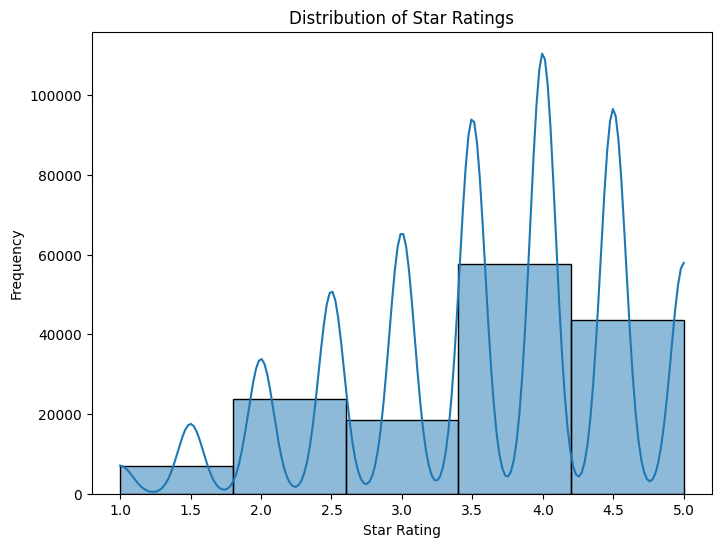

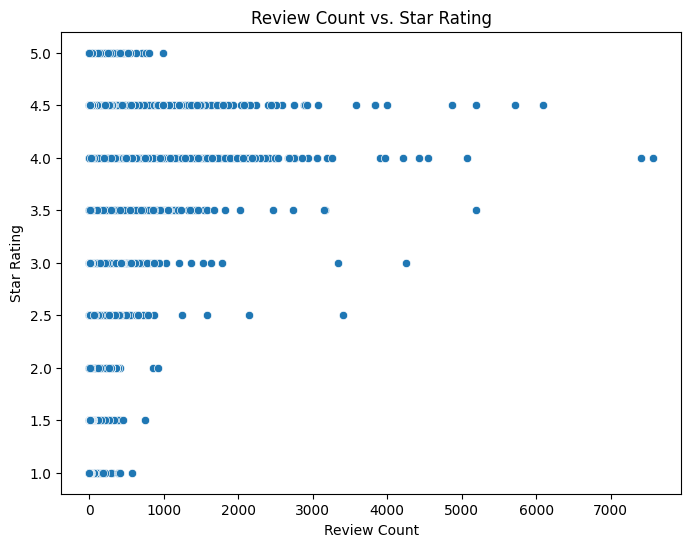

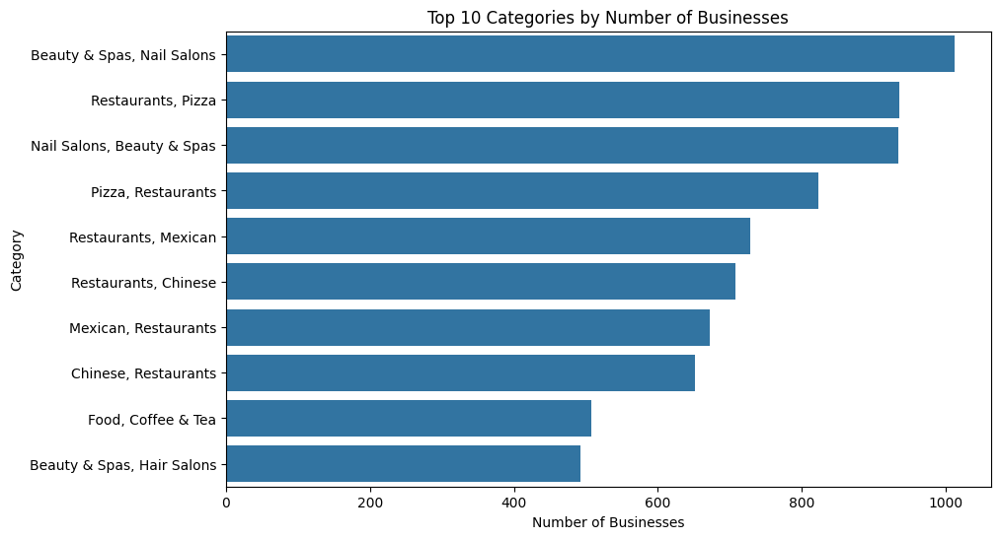

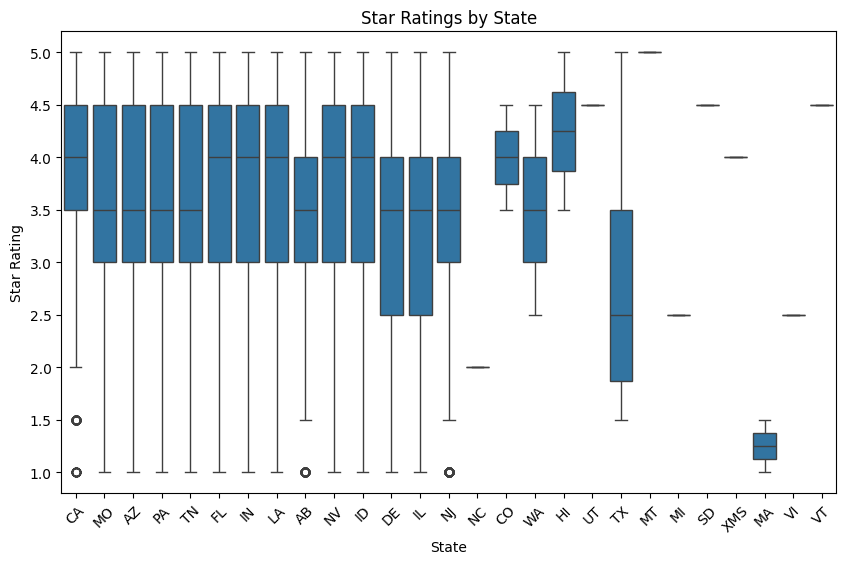

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Connect to SQLite database
conn = sqlite3.connect('yelp_business_data.db')

# Function to execute SQL query and return pandas dataframe
def execute_query(query):
    return pd.read_sql_query(query, conn)

# Example 1: Histogram of star ratings distribution
query1 = '''
SELECT stars
FROM Business;
'''
star_ratings_df = execute_query(query1)

plt.figure(figsize=(8, 6))
sns.histplot(star_ratings_df['stars'], bins=5, kde=True)
plt.title('Distribution of Star Ratings')
plt.xlabel('Star Rating')
plt.ylabel('Frequency')
plt.show()

# Example 2: Scatter plot of review count vs. star rating
query2 = '''
SELECT review_count, stars
FROM Business;
'''
review_count_stars_df = execute_query(query2)

plt.figure(figsize=(8, 6))
sns.scatterplot(x='review_count', y='stars', data=review_count_stars_df)
plt.title('Review Count vs. Star Rating')
plt.xlabel('Review Count')
plt.ylabel('Star Rating')
plt.show()

# Example 3: Bar plot of top 10 categories by number of businesses
query3 = '''
SELECT categories, COUNT(*) AS business_count
FROM Business
GROUP BY categories
ORDER BY business_count DESC
LIMIT 10;
'''
top_categories_df = execute_query(query3)

plt.figure(figsize=(10, 6))
sns.barplot(x='business_count', y='categories', data=top_categories_df)
plt.title('Top 10 Categories by Number of Businesses')
plt.xlabel('Number of Businesses')
plt.ylabel('Category')
plt.show()

# Example 4: Box plot of star ratings by state
query4 = '''
SELECT state, stars
FROM Business;
'''
stars_by_state_df = execute_query(query4)

plt.figure(figsize=(10, 6))
sns.boxplot(x='state', y='stars', data=stars_by_state_df)
plt.title('Star Ratings by State')
plt.xlabel('State')
plt.ylabel('Star Rating')
plt.xticks(rotation=45)
plt.show()

# Close connection
conn.close()
